### **Experiment 3**

A type of signal is chosen, and one second is synthesized with various frequencies.

The signal is segmented using specified window and hop size. The Fractional Fourier Transform (FrFT) of each segment is computed using the same angle:

$$ \hat{s}_{\alpha,n} = \mathcal{F}_{\alpha} (s_n), \quad \text{where } \, n = 0, 1, \ldots, N. $$

The transformed segments are then multiplied with a Gaussian function that changes its symmetry axis in time. This process is done to mimic a frequency domain filter using the Fourier Transform. We called this process $\alpha$-filtering.

Finally, the transformed and $\alpha$-filtered signals are thrown back to the time domain with the inverse of the Fractional Fourier Transform used and overlaped and added to create the final signal.

**Remarks:**
1. The use of different window sizes and hop sizes can significantly impact the results
2. The Hann window is chosen for its properties in minimizing spectral leakage and ensuring smooth transitions between segments.

In [1]:
from auxiliar import *

def experiment_3(frequencies, center_freqs_start_end_list, angles, windows_size, hop_length, complex_part, window_type_input="rectangular", window_type_output="hann",fs=44100):
    maker = make_sinusoid if input_type == "sinusoid" else make_triangle_wave if input_type == "triangle" else make_square_wave if input_type == "square" else make_sawtooth_wave if input_type == "sawtooth" else ValueError("Invalid input type")
    outputs_dict = []
    for freq in frequencies:
        sinusoid = maker(freq, 2, fs)
        rows = []
        for angle in angles:
            for center_freq_start_end in center_freqs_start_end_list:
                name = f"Freq: {freq}, Angle: {angle}, Center Freq: {center_freq_start_end}"
                sound = frft_filter_automatization(sinusoid, [angle, angle], center_freq_start_end, [1, 1], windows_size, hop_length, complex_part, fs, window_type_input, window_type_output)
                rows.append([name, sound])
        outputs_dict.append(rows)
    create_audio_grid(outputs_dict,len(frequencies), len(angles)*len(center_freqs_start_end_list),  fs, False)

# Type of input
input_type = "sinusoid"

# Frequencies and angles
frequencies                 = [220, 880*8]
angles                      = [0.1, 0.2, 0.3, 0.4]
center_freqs_start_end_list = [[100, 10000]]

# Windows size = 8192, hop_length = 4096
windows_size, hop_length = 8192, 4096
print("Experiment 3: Windows size = 8192, hop_length = 4096, complex part = real part")
experiment_3(frequencies, center_freqs_start_end_list, angles, windows_size, hop_length, "real_part")

# Windows size = 16384, hop_length = 8192
windows_size, hop_length = 16384, 8192
print("Experiment 3: Windows size = 16384, hop_length = 8192, complex part = real part")
experiment_3(frequencies, center_freqs_start_end_list, angles, windows_size, hop_length, "real_part")

Experiment 3: Windows size = 8192, hop_length = 4096, complex part = real part


Experiment 3: Windows size = 16384, hop_length = 8192, complex part = real part


In [2]:
from auxiliar import *
from IPython.display import Audio, display

def sound_list_maker(freq, angles, windows_size, hop_length, complex_part="real_part", window_type_input="rectangular", window_type_output="hann",fs=44100):
    sound_list = []
    sinusoid = make_sinusoid(freq, 2, fs)
    for angle in angles:
        for center_freq_start_end in center_freqs_start_end_list:
            sound = frft_filter_automatization(sinusoid, [angle, angle], center_freq_start_end, [1, 1], windows_size, hop_length, complex_part, fs, window_type_input, window_type_output)
            sound_list.append(sound)
    return sound_list

def video_sound_maker(freq, angles, windows_size, hop_length, fs=44100):
    list_of_sounds = sound_list_maker(freq, angles, windows_size, hop_length)
    silence = np.zeros(fs//2)
    output  = np.zeros(0)
    for sound in list_of_sounds:
        output = np.concatenate((output, sound, silence))
    output = np.concatenate((output, silence))
    # play output using Display(Audio) from ipd
    display(Audio(output, rate=fs))
    return output
    
# Frequencies and angles
frequencies                 = [220, 880*4]
angles                      = [0.01, 0.05, 0.1, 0.25, 0.5]
center_freqs_start_end_list = [[100, 10000]]
windows_sizes, hop_lengths  = [2048*4, 2048*8], [1024*4, 1024*8]

sounds = []

for freq in frequencies:
    for windows_size, hop_length in zip(windows_sizes, hop_lengths):
        name = f"Freq_{freq}_windows_size_{windows_size}"
        sound = video_sound_maker(freq, angles, windows_size, hop_length, fs=44100)
        sounds.append([name, sound])

print(len(sounds))


4


ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Video Freq_220_windows_size_8192.mp4 created


ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Video Freq_220_windows_size_16384.mp4 created


ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Video Freq_3520_windows_size_8192.mp4 created


ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Video Freq_3520_windows_size_16384.mp4 created


[out#0/mp4 @ 0x5e5f46061d80] video:340kB audio:238kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 2.366540%
frame=  528 fps=0.0 q=-1.0 Lsize=     591kB time=00:00:12.28 bitrate= 394.2kbits/s speed=29.8x    
[libx264 @ 0x5e5f460a5f00] frame I:3     Avg QP:18.40  size: 13871
[libx264 @ 0x5e5f460a5f00] frame P:152   Avg QP:22.50  size:  1246
[libx264 @ 0x5e5f460a5f00] frame B:373   Avg QP:26.50  size:   312
[libx264 @ 0x5e5f460a5f00] consecutive B-frames:  0.8% 11.4% 11.4% 76.5%
[libx264 @ 0x5e5f460a5f00] mb I  I16..4: 25.0% 65.0% 10.0%
[libx264 @ 0x5e5f460a5f00] mb P  I16..4:  0.7%  0.7%  0.1%  P16..4: 24.1%  3.3%  1.5%  0.0%  0.0%    skip:69.6%
[libx264 @ 0x5e5f460a5f00] mb B  I16..4:  0.1%  0.0%  0.0%  B16..8: 20.7%  0.5%  0.0%  direct: 0.0%  skip:78.6%  L0:43.2% L1:56.6% BI: 0.2%
[libx264 @ 0x5e5f460a5f00] 8x8 transform intra:52.2% inter:97.3%
[libx264 @ 0x5e5f460a5f00] coded y,uvDC,uvAC intra: 41.9% 60.4% 42.3% inter: 1.4% 5.3% 0.3%
[libx264 @ 0x5e5f460a5f00] i1

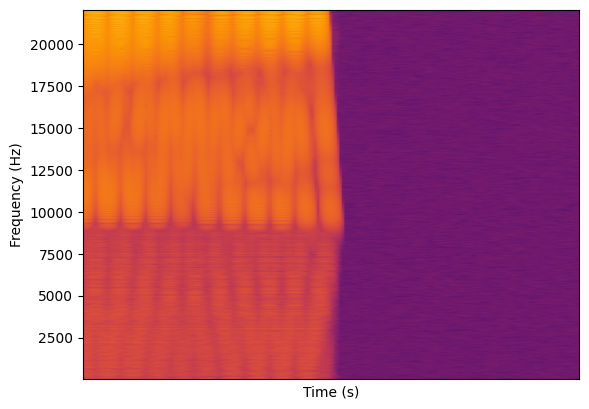

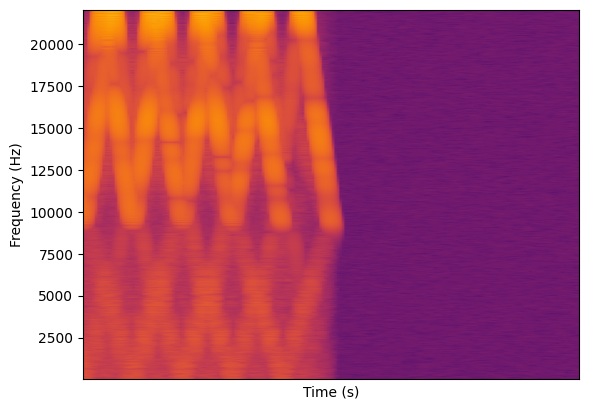

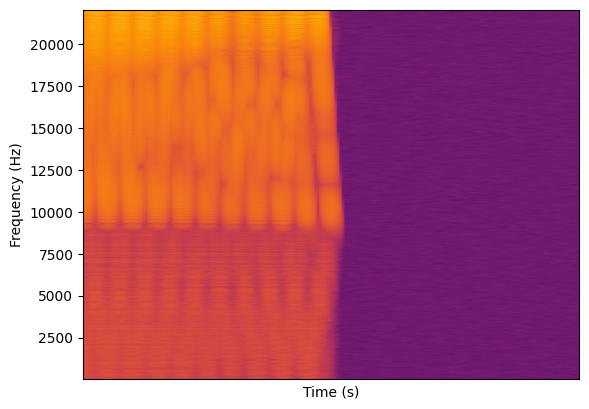

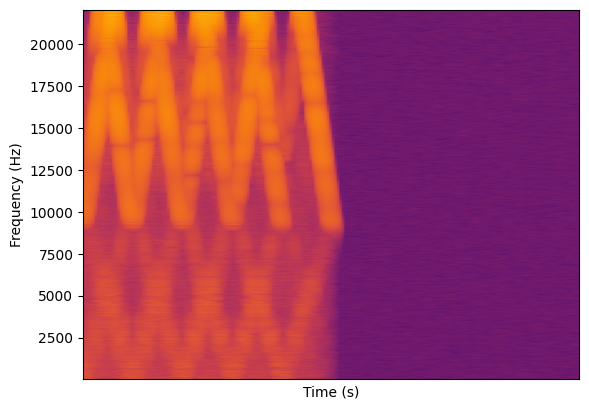

In [3]:
# spectrogram representation videos
for name, sound in sounds:
    create_spectrogram_video(sound, 44100, f"spectrogram_{name}_alpha-band_manipulation.mp4", window_seconds=2)
    print(f"Video {name}.mp4 created")

In [4]:
# specrtrum representation videos
for name, sound in sounds:
    create_spectrum_video(sound, 44100, f"spectrum_{name}_alpha-band_manipulation.mp4", figsize=(14, 10))
    print(f"Video for {name} created")

ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Video for Freq_220_windows_size_8192 created


ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Video for Freq_220_windows_size_16384 created


ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Video for Freq_3520_windows_size_8192 created


ffmpeg version 6.1.1-3ubuntu5 Copyright (c) 2000-2023 the FFmpeg developers
  built with gcc 13 (Ubuntu 13.2.0-23ubuntu3)
  configuration: --prefix=/usr --extra-version=3ubuntu5 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --disable-omx --enable-gnutls --enable-libaom --enable-libass --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libglslang --enable-libgme --enable-libgsm --enable-libharfbuzz --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-libzimg --ena

Video for Freq_3520_windows_size_16384 created


[out#0/mp4 @ 0x61da7c4d9080] video:3253kB audio:85kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.398938%
size=    3352kB time=00:00:12.28 bitrate=2235.2kbits/s speed= 203x    
[aac @ 0x61da7c501080] Qavg: 15698.653
